In [3]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.neighbors import KNeighborsRegressor
import matplotlib.pylab as plt

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV
from dmba import plotDecisionTree

from sklearn.metrics import mean_squared_error

data = pd.read_csv('/Users/nivethida/Downloads/BostonHousing.csv')
data.info()

no display found. Using non-interactive Agg backend
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
CRIM         506 non-null float64
ZN           506 non-null float64
INDUS        506 non-null float64
CHAS         506 non-null int64
NOX          506 non-null float64
RM           506 non-null float64
AGE          506 non-null float64
DIS          506 non-null float64
RAD          506 non-null int64
TAX          506 non-null int64
PTRATIO      506 non-null float64
LSTAT        506 non-null float64
MEDV         506 non-null float64
CAT. MEDV    506 non-null int64
dtypes: float64(10), int64(4)
memory usage: 55.5 KB


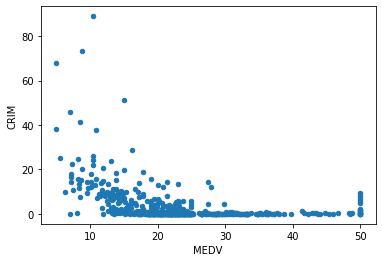

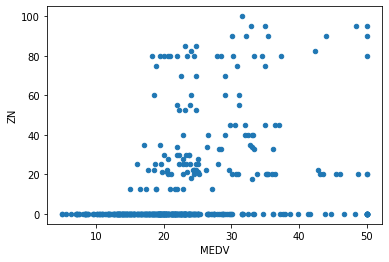

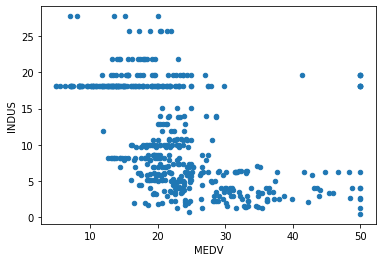

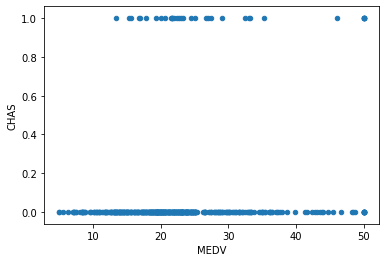

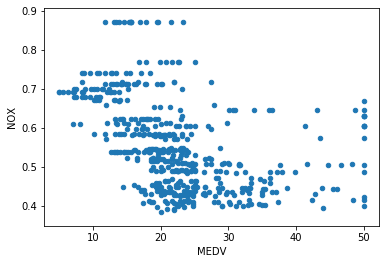

...

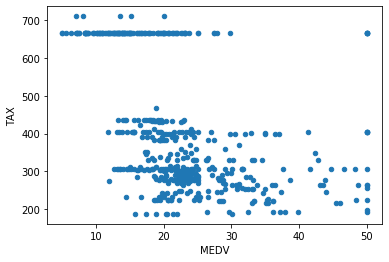

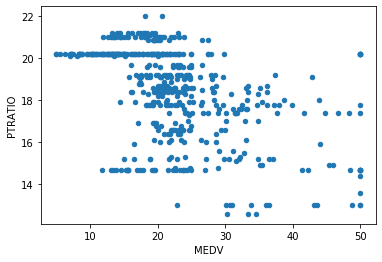

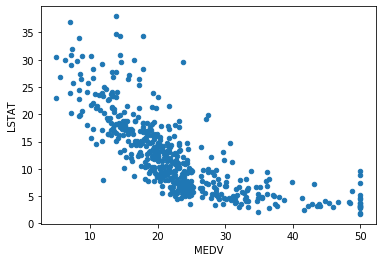

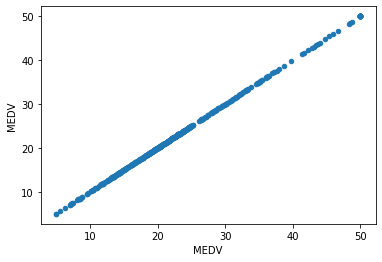

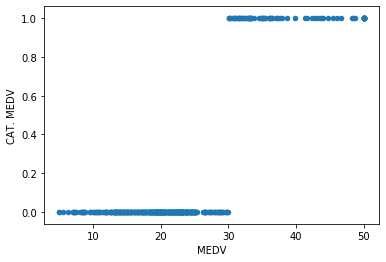

In [4]:
# Scatter plot comparing MEDV value with all other predictors.
for x in data.columns[:]:
    data.plot.scatter(x='MEDV',y=x)
    plt.show()

In [5]:
# Droppping the CAT. MEDV column
data = data.drop(list(['CAT. MEDV']), axis = 1)

columns = data.columns.tolist()

# Scaling the data using minmax scalar. 
# data.iloc[:,:len(columns)-1] Leaving the last column MEDV out.

scaler = preprocessing.MinMaxScaler()
scaler.fit(data.iloc[:,:len(columns)-1])
data_scaled = pd.DataFrame(scaler.transform(data.iloc[:,:len(columns)-1]), columns=data.columns[:len(columns)-1])
data_scaled.head()


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT
0,0.000000,0.18,0.067815,0.0,0.314815,0.577505,0.641607,0.269203,0.000000,0.208015,0.287234,0.089680
1,0.000236,0.00,0.242302,0.0,0.172840,0.547998,0.782698,0.348962,0.043478,0.104962,0.553191,0.204470
2,0.000236,0.00,0.242302,0.0,0.172840,0.694386,0.599382,0.348962,0.043478,0.104962,0.553191,0.063466
3,0.000293,0.00,0.063050,0.0,0.150206,0.658555,0.441813,0.448545,0.086957,0.066794,0.648936,0.033389
4,0.000705,0.00,0.063050,0.0,0.150206,0.687105,0.528321,0.448545,0.086957,0.066794,0.648936,0.099338


In [6]:
y = data['MEDV'] # Response variable

# Partitioning the data into training (60%) and validation (40%) sets.

train_X, valid_X, train_y, valid_y = train_test_split(data_scaled, y, test_size=0.4, random_state=26)

print('Training set x', train_X.shape)
print('Validation set x', valid_X.shape)
print('Training set y', train_y.shape)
print('Validation set y', valid_y.shape)

Training set x (303, 12)
Validation set x (203, 12)
Training set y (303,)
Validation set y (203,)


In [7]:
# Performing a k-NN prediction with all 12 predictors with four different metrics.
metric_list=['euclidean','manhattan','chebyshev','minkowski']
             
results = []
for k in range(1, 15):
    for m in metric_list:
        knn = KNeighborsRegressor(n_neighbors=k,metric=m,n_jobs=-1).fit(train_X, train_y)
        results.append({
            'k_distance': str(k)+" "+str(m),
            'MAE': mean_absolute_error(valid_y, knn.predict(valid_X))
    })

# Convert results to a pandas data frame
results = pd.DataFrame(results)
results.sort_values(by='MAE')



,k_distance,MAE
9,3 manhattan,2.971264
17,5 manhattan,3.001281
13,4 manhattan,3.034236
21,6 manhattan,3.045813
5,2 manhattan,3.120443
25,7 manhattan,3.138353
29,8 manhattan,3.196244
41,11 manhattan,3.214465
37,10 manhattan,3.221429
33,9 manhattan,3.230432


The best model is the model with 3 k as it has the lowest error 2.971264 and using manhatten metric.

In [8]:
newValue = pd.DataFrame([{ "CRIM" : 0.2, 
                          "ZN" : 0,
                          "INDUS" : 7, 
                          "CHAS" : 0, 
                          "NOX" : 0.538, 
                          "RM" : 6, 
                          "AGE" : 62, 
                          "DIS" : 4.7, 
                          "RAD" : 4, 
                          "TAX" : 307, 
                          "PTRATIO" : 21,
                          "LSTAT" : 10
                         }])
newValue

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT
0,0.2,0,7,0,0.538,6,62,4.7,4,307,21,10


In [9]:
# Normalizing the new value 
newValue_scaled = pd.DataFrame(scaler.transform(newValue), columns = newValue.columns)
newValue_scaled

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT
0,0.002177,0.0,0.239736,0.0,0.314815,0.467331,0.608651,0.324673,0.130435,0.229008,0.893617,0.228201


In [10]:
# Train model with k=3 and metric=manhattan which is the best metric predicted using KNN.
knn = KNeighborsRegressor(n_neighbors=3,metric='manhattan',n_jobs=-1)
knn.fit(train_X, train_y)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='manhattan',
                    metric_params=None, n_jobs=-1, n_neighbors=3, p=2,
                    weights='uniform')

In [11]:
knn.predict(newValue_scaled)

array([19.26666667])

With the model we created when we predict the MEDV for this value is 19.266. 

In [12]:
data_cars = pd.read_csv("/Users/nivethida/Downloads/ToyotaCorolla(1)(1).csv")

In [13]:
data_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 39 columns):
Id                   1436 non-null int64
Model                1436 non-null object
Price                1436 non-null int64
Age_08_04            1436 non-null int64
Mfg_Month            1436 non-null int64
Mfg_Year             1436 non-null int64
KM                   1436 non-null int64
Fuel_Type            1436 non-null object
HP                   1436 non-null int64
Met_Color            1436 non-null int64
Color                1436 non-null object
Automatic            1436 non-null int64
CC                   1436 non-null int64
Doors                1436 non-null int64
Cylinders            1436 non-null int64
Gears                1436 non-null int64
Quarterly_Tax        1436 non-null int64
Weight               1436 non-null int64
Mfr_Guarantee        1436 non-null int64
BOVAG_Guarantee      1436 non-null int64
Guarantee_Period     1436 non-null int64
ABS                  1436 non

In [14]:
# Setting up dummy colums for Object
data_cars=pd.concat([data_cars, pd.get_dummies(data_cars['Fuel_Type'], prefix_sep='_',)],axis=1)

# Dropping the Object columns
data_cars = data_cars.drop(list(['Fuel_Type']), axis = 1)
data_cars = data_cars.drop(list(['Model']), axis = 1)
data_cars = data_cars.drop(list(['Color']), axis = 1)

data_cars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 39 columns):
Id                   1436 non-null int64
Price                1436 non-null int64
Age_08_04            1436 non-null int64
Mfg_Month            1436 non-null int64
Mfg_Year             1436 non-null int64
KM                   1436 non-null int64
HP                   1436 non-null int64
Met_Color            1436 non-null int64
Automatic            1436 non-null int64
CC                   1436 non-null int64
Doors                1436 non-null int64
Cylinders            1436 non-null int64
Gears                1436 non-null int64
Quarterly_Tax        1436 non-null int64
Weight               1436 non-null int64
Mfr_Guarantee        1436 non-null int64
BOVAG_Guarantee      1436 non-null int64
Guarantee_Period     1436 non-null int64
ABS                  1436 non-null int64
Airbag_1             1436 non-null int64
Airbag_2             1436 non-null int64
Airco                1436 non-nu

In [15]:
predictors=['Age_08_04', 'KM', 'Petrol', 'Diesel', 'HP', 'Automatic', 'Doors', 'Quarterly_Tax', 'Mfr_Guarantee', 'Guarantee_Period', 
   'Airco', 'Automatic_airco', 'CD_Player', 'Powered_Windows', 'Sport_Model', 'Tow_Bar']

x = data_cars[predictors]
# Response variable
y = data_cars['Price']

# Partioning the data into training (60%), and validation (40%).
train_X, valid_X, train_y, valid_y = train_test_split(x, y, test_size=0.4, random_state=1)
print('Training set:', train_X.shape, 'Validation set:', valid_X.shape)


Training set: (861, 16) Validation set: (575, 16)


In [16]:
# Full grown regression tree.
deepTree = DecisionTreeRegressor(random_state=1)
deepTree.fit(train_X, train_y)

print('Tree has {} nodes'.format(deepTree.tree_.node_count))
plotDecisionTree(deepTree, feature_names=train_X.columns, impurity=False)


Tree has 1487 nodes
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.964842 to fit



From the above decision tree we could see the first four most important predictors.
Age,
HP,
Quaterly_Tax,
KM

                          features  importance
features                                      
Age_08_04                Age_08_04    0.833402
KM                              KM    0.050349
Petrol                      Petrol    0.000029
Diesel                      Diesel    0.000477
HP                              HP    0.053189
Automatic                Automatic    0.001061
Doors                        Doors    0.005507
Quarterly_Tax        Quarterly_Tax    0.017774
Mfr_Guarantee        Mfr_Guarantee    0.003816
Guarantee_Period  Guarantee_Period    0.002422
Airco                        Airco    0.004569
Automatic_airco    Automatic_airco    0.013358
CD_Player                CD_Player    0.002122
Powered_Windows    Powered_Windows    0.005234
Sport_Model            Sport_Model    0.004465
Tow_Bar                    Tow_Bar    0.002228


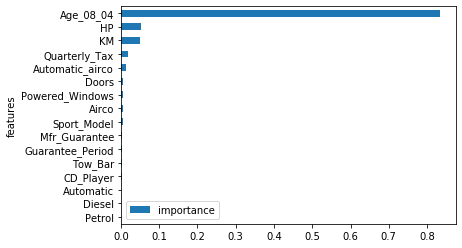

In [17]:
#Compare the prediction errors of the training sets by examining their RMS error 

importance = pd.DataFrame({'features': train_X.columns, 
                           'importance': deepTree.feature_importances_})
importance.index=importance.features
print(importance)
importance.sort_values(by='importance', ascending=True).plot.barh()

From the above bar plot we could see the first four most important predictors.
Age
HP
KM
Quaterly_Tax

In [18]:
"RMSE full grown regression tree: "+str(mean_squared_error(valid_y, deepTree.predict(valid_X))**.5)

'RMSE full grown regression tree: 1499.8869818292542'

0.68


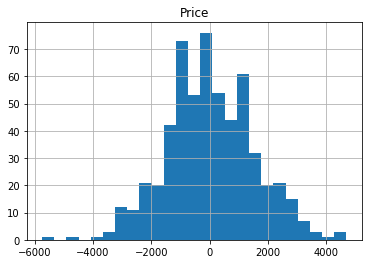

In [19]:
#Compare the prediction errors of the training and validation sets by examining their RMS error and by plotting errors using a histogram. 
valid_pred = deepTree.predict(valid_X) 
all_residuals = valid_y - valid_pred
# Determine the percentage of datapoints with a residual in [-1500, 1500] = approx.
# 75%
print(len(all_residuals[(all_residuals > -1500) & (all_residuals < 1500)]) /
len(all_residuals))
pd.DataFrame(all_residuals).hist(bins=25) 
plt.show()

Tree has 59 nodes


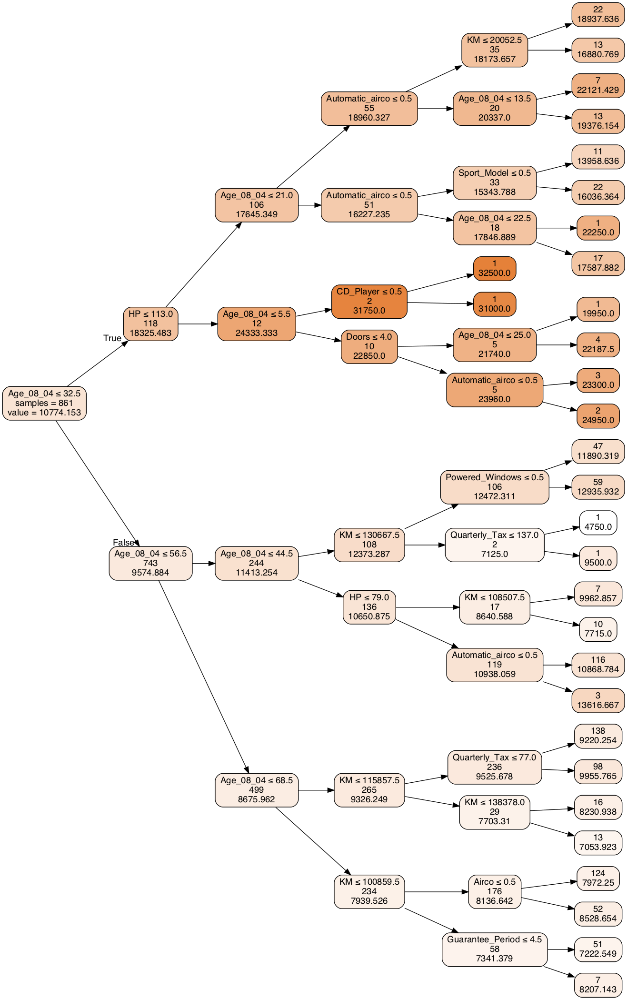

In [20]:
# smaller tree max_depth=5
shallowTree = DecisionTreeRegressor(max_depth=5)
shallowTree.fit(train_X, train_y)
print('Tree has {} nodes'.format(shallowTree.tree_.node_count))
plotDecisionTree(shallowTree, feature_names=train_X.columns, rotate=True, impurity=False)

'RMSE value of smaller tree max_depth=5: 1151.3377049495327'

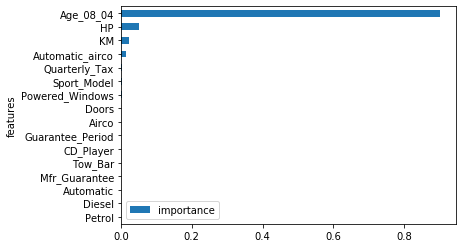

In [21]:
# Variable importance
importance = pd.DataFrame({'features': train_X.columns, 
                           'importance': shallowTree.feature_importances_})
importance.index=importance.features
importance.sort_values(by='importance', ascending=True).plot.barh()

"RMSE value of smaller tree max_depth=5: "+str(mean_squared_error(valid_y, shallowTree.predict(valid_X))**.5)

Improved parameters:  {'max_depth': 6, 'min_samples_split': 7}
Tree has 91 nodes


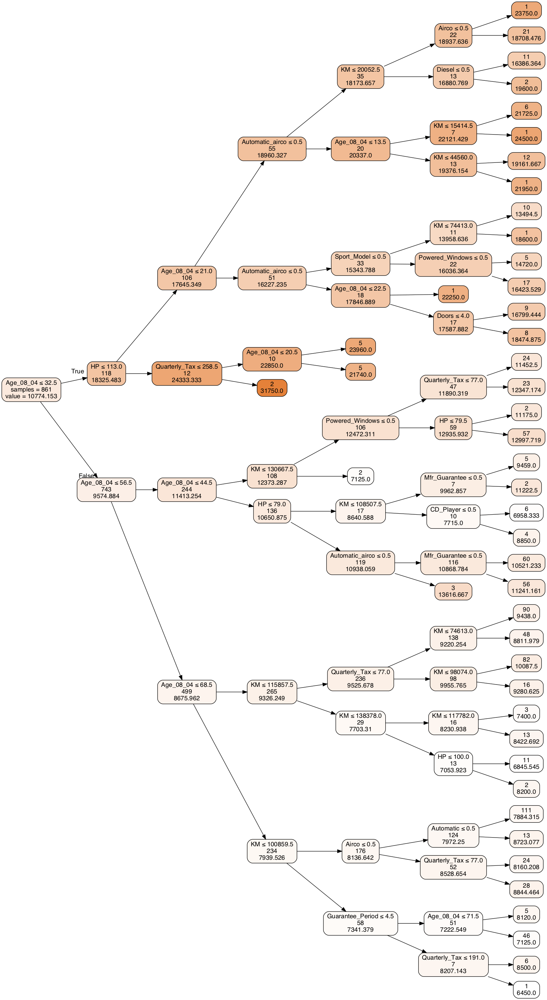

In [22]:
# using gridsearchcv to find optimized tree

param_grid = {
'max_depth': list(np.arange(0,20)), 
'min_samples_split': list(np.arange(2,20))
}
gridSearch = GridSearchCV(DecisionTreeRegressor(random_state=1), param_grid, cv=5, n_jobs=-1) 
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

optRegTree = gridSearch.best_estimator_
print('Tree has {} nodes'.format(optRegTree.tree_.node_count)) 
plotDecisionTree(optRegTree, feature_names=train_X.columns, rotate=True)

'RMSE value of GridSearchCV tree : 1208.720949424195'

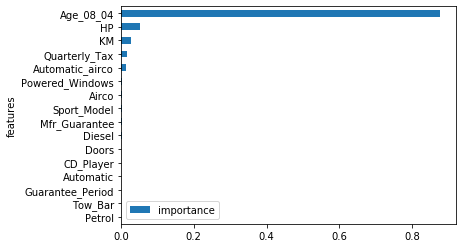

In [23]:
# Variable importance
importance = pd.DataFrame({'features': train_X.columns, 
                           'importance': optRegTree.feature_importances_})
importance.index=importance.features
importance.sort_values(by='importance', ascending=True).plot.barh()

"RMSE value of GridSearchCV tree : "+str(mean_squared_error(valid_y, optRegTree.predict(valid_X))**.5)

In [24]:
# using RandomForestRegressor
# Keeping less parameters in param_grid to reduce computational time
param_grid = {
    'max_depth': [7]
}
gridSearch = GridSearchCV(RandomForestRegressor(random_state=1), 
                          param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

rf = gridSearch.best_estimator_

print("RMSE: "+str(mean_squared_error(valid_y, rf.predict(valid_X))**.5))

Improved parameters:  {'max_depth': 7}
RMSE: 1052.0781929197988


In [25]:
# using GradientBoostingRegressor
param_grid = {
    
    'learning_rate':list(np.arange(0.01,0.22,.01)),
    'min_samples_split': list(np.arange(3,7)),
    'max_leaf_nodes': list(np.arange(4,7))
}

gridSearch = GridSearchCV(GradientBoostingRegressor(random_state=1), 
                          param_grid, cv=5, n_jobs=-1)
gridSearch.fit(train_X, train_y)
print('Improved parameters: ', gridSearch.best_params_)

gbm = gridSearch.best_estimator_

print("RMSE: "+str(mean_squared_error(valid_y, gbm.predict(valid_X))**.5))

Improved parameters:  {'learning_rate': 0.19, 'max_leaf_nodes': 5, 'min_samples_split': 5}
RMSE: 994.1300245097656


RMSE value of GridSearchCV tree with DecisionTreeRegressor: 1208.720949424195 with nodes 91

RMSE value of GridSearchCV tree with RandomForestRegressor: 1052.0781929197988 with nodes 91

RMSE value of GridSearchCV tree with GradientBoostingRegressor: 994.1300245097656 with nodes 91

RMSE value of smaller tree max_depth=5: 1191.6916775394207 with nodes 53

RMSE full grown regression tree: 1499.8869818292542 with nodes 1487

From the above we can conclue that the GradientBoostingRegressor has better RMSE so the  GridSearchCV tree is the best with less computational time, less RMSE.